# Lab 4: GAN Example Fixing
Team: Mike Wisniewski, Henry Lambson, Alex Gregory

Compare this implimentation to the one from the official Torch tutorial:
https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

Author's Note: We began this lab in late March and thus were unaware on our option to choose the Keras implementation until much later.  Although Keras is our stronger suit for Neural Network implementation, we did not convert our work over because we had about 95% of the lab completed at this point.  We point this out in case of possible silly mistakes or inconsistencies that wouldn't be normal using Keras.  We attempted our best at implementing in torch and we believe our results are sound enough to signal that our implementation is correct or mostly correct.

In [1]:
import numpy as np
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data

import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.autograd as autograd
from torch.autograd import Variable
from torch.nn.utils.parametrizations import spectral_norm

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Seed control, for better reproducibility 
# NOTE: this does not gurantee results are always the same
seed = 22
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

if torch.cuda.is_available():
    device = torch.device("cuda:0")
    # work on a single GPU or CPU
    cudnn.benchmark=True
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()
    Tensor = torch.cuda.FloatTensor
else:
    device = torch.device("cpu")
    cudnn.benchmark=False
    Tensor = torch.FloatTensor

print(device)

EPOCHS = 500


cpu


In [2]:
import pandas as pd
wgan_df = pd.read_csv("wgan.csv")
vanilla_FM_df = pd.read_csv("vanilla_FM.csv")
vanilla_FM_HA_df = pd.read_csv("vanilla_FM_HA.csv")
vanilla_LS_df = pd.read_csv("vanilla_LS.csv")
vanilla_OHE_df = pd.read_csv("vanilla_OHE.csv")
wgan_SN_df = pd.read_csv("wgan_SN.csv")
wgan_df = pd.read_csv("wgan.csv")

## Utility Functions/Preprocessing

The following section contains code from the given .ipynb with no modifications.  The intended use of this code is to provide a way to plot images and load/save model checkpoints.  No modifications were made from the original

In [2]:
def imshow(img):
    # custom show in order to display
    # torch tensors as numpy
    npimg = img.numpy() / 2 + 0.5 # from tensor to numpy
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

batch_size = 250 # might try to use large batches (we will discuss why later when we talk about BigGAN)
# NOTE: the batch_size should be an integer divisor of the data set size  or torch
# will give you an error regarding batch sizes of "0" when the data loader tries to
# load in the final batch

dataset = dset.CIFAR10(root='data/cifar/', download=True,
                       transform=transforms.Compose([
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                       ]))

# frogs are the sixth class in the dataset 
classes = ['plane', 'car', 'bird', 'cat','deer', 'dog', 'frog', 'horse', 'ship', 'truck']
frog = 6
frog_index = [i for i, x in enumerate(dataset.targets) if x == 6]
print("number of frog imgs: ", len(frog_index))

frog_set = torch.utils.data.Subset(dataset, frog_index)


dataloader = torch.utils.data.DataLoader(frog_set, batch_size=batch_size,
                                         shuffle=True, num_workers=1)

Files already downloaded and verified
number of frog imgs:  5000


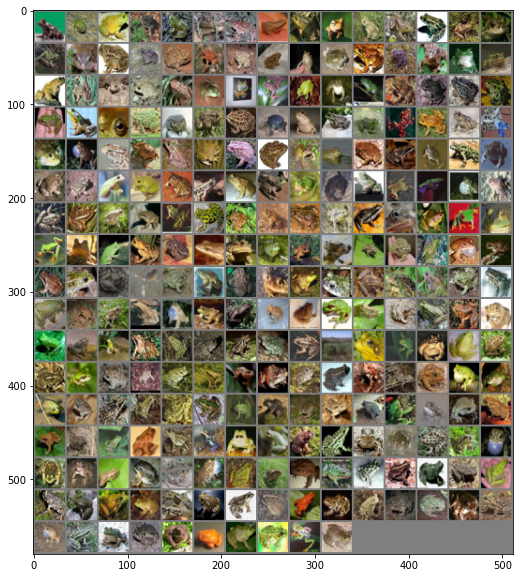

Image shape:  torch.Size([3, 32, 32])


In [3]:
# get some random training images
dataiter = iter(dataloader)
real_image_examples, _ = next(dataiter)

# show images
plt.figure(figsize=(10,10))
imshow(torchvision.utils.make_grid(real_image_examples, nrow=int(np.sqrt(batch_size))))
print("Image shape: ", real_image_examples[0].size())


In [4]:
# create Utils functions for saving and loading 
def save_checkpoint(new_img_list, loaded_ims, g_model, d_model, file_prefix):
    # save off a checkpoint of the current models and images
    
    # convert to numpy images for saving
    ims = np.array([np.transpose(np.hstack((i,real_image_numpy)), (2,1,0)) for i in new_img_list])
    
    # if we have saved images from another run, concatenate and save them here
    if len(loaded_ims)>0:
        ims = np.concatenate((loaded_ims,ims)) # concatenate these images with other runs (if needed)
        
    np.save(f'models/gan_models/{file_prefix}_images.npy',ims)

    # save the state of the models (will need to recreate upon reloading)
    torch.save({'state_dict': g_model.state_dict()}, f'models/gan_models/{file_prefix}_gen.pth')
    torch.save({'state_dict': d_model.state_dict()}, f'models/gan_models/{file_prefix}_dis.pth')
   
def load_checkpoint(file_prefix, gen_func, disc_func):
    # load up checkpoint images from previous runs
    ims = np.load(f'models/gan_models/{file_prefix}_images.npy')

    generator = gen_func() # create generator (no weights)
    discriminator = disc_func() # create disciminator (no weights)

    # now populate the weights from a previous training
    checkpoint = torch.load(f'models/gan_models/{file_prefix}_gen.pth')
    generator.load_state_dict(checkpoint['state_dict'])

    checkpoint = torch.load(f'models/gan_models/{file_prefix}_dis.pth')
    discriminator.load_state_dict(checkpoint['state_dict'])
    
    return ims, generator, discriminator
    

# Vanilla Generative Adversarial Networks
In this implementation of GANS, we will use a few of the tricks from F. Chollet and from Salimans et al. In particular, we will add some noise to the labels. 

>[3 points] First, look at the code for the generator and discriminator/critic. Adjust the architecture to also sample from one hot encodings and use embeddings of class encodings (like in the LS-GAN paper). Use this same one hot encoding (both sampled and from the actual classes) in the discriminator/critic.  This GAN will be your base implementation--run this for at least 500 epochs (ideally more). 

In the below code provided to us, we adjust the vanilla Generator and Discriminator by adding an Embedding layer based on the number of classes in this dataset.  Per the above code before this section, the number of classes were outlined to us in the "classes" variable.  We have 10 classes.  We use the length of this variable to construct our embedding class.  In order to connect an embedding layer to the first linear layer, we needed to increase the latent dimensions by the number of classes we embedded.  This makes sense because as we embed a certain amount of classes, those classes need to be represented within the latent space.  Therefore, in order for everything to connect, the Embedding layer must take input of Num Classes, Num Classes, and the Linear layer must take an input of latent space + num classes.  This logic is applicable to both the generator and discriminator classes.

In addition to adding an embedding layer, we adjusted the forward method to embed the labels.  We then concat the random noise (z) with the embedded labels to form a latent space with embeddings.  This is then pass through our network - hence the need to change the dimensions of our inputs and outputs of our generator and discriminator classes.

In the following sections, we run the Vanilla GAN with OHE capability, the Least Squares GAN (with OHE) and the Wasserstein GAN with Gradient Penalty (and with OHE).  These models were ran before we were notified to only run one variant, so we included these into our analysis but when implementing 3 new features, we built only off of the Vanilla OHE GAN twice and the WGAN once.  Analysis will be provided at the end of each section.

In [5]:
latent_dim = 32
height = 32
width = 32
channels = 3
NUM_CLASSES = len(classes)

# Note: according to Radford (2016), is there anything done here
# that potentially could have been different? 
# Anything wrong here based on Radford paper???
# NOTE: Dr. Larson Fixed most errors here for understanding

class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()
        # save these two functions

        # First, transform the input into a 8x8 128-channels feature map
        self.init_size = width // 4 # one quarter the image size 

        # MODIFICATION: add embedding layer here
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        # MODIFICATION: need to increase latent space to include OHE classes
        self.l1 = nn.Sequential(nn.Linear(latent_dim + NUM_CLASSES, 128 * self.init_size ** 2))
        # there is no reshape layer, this will be done in forward function
        # alternately we could us only the functional API
        # and bypass sequential altogether

        # we will use the sequential API
        # in order to create some blocks
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False), #16x16
            nn.Conv2d(128, 128, 3, padding=1), #16x16

            # Then, add a convolution layer
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            # Upsample to 32x32
            # Transpose is not causing problems, but is slowing down because stride default 1
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False), # 32x32
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            #nn.ConvTranspose2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            # Produce a 32x32xRGB-channel feature map
            nn.Conv2d(64, channels, kernel_size=3, padding=1),
            nn.Tanh(),
        )

    # MODIFICATION: labels need to be encoded here
    def forward(self, z, labels):

        # MODIFICATION: convert labels
        labels_embedded = self.e1(labels)

        # MODIFICATION: concat z, labels vectors
        z = torch.cat([z, labels_embedded], dim=1)

        # call the functions from earlier:
        # expand the sampled z to 8x8
        out = self.l1(z)
        out = torch.reshape(out, (out.shape[0], 128, self.init_size, self.init_size))
        # use the view function to reshape the layer output
        #  old way for earlier Torch versions: out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

In [6]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        self.model = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.3, inplace=True),
            nn.BatchNorm2d(32),

            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(128),
        )

        # The height and width of downsampled image
        ds_size = width // 2 ** 4
        # Classification layer
        # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1), 
                                                  nn.Sigmoid())

    # MODIFICATION: labels need to be encoded here
    def forward(self, img, labels):

        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        validity = self.classification_layer(out)
        return validity

In [7]:
# custom weights initialization called on netG and netD
# this function from PyTorch's officail DCGAN example:
# https://github.com/pytorch/examples/blob/master/dcgan/main.py#L112
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02) # filters are zero mean, small STDev
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02) # batch norm is unit mean, small STDev
        # gamma starts around 1
        m.bias.data.fill_(0) # like normal, biases start at zero
        # beta starts around zero
    elif isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.01)

In [8]:
generator = Generator()
discriminator = Discriminator()

In [9]:
# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# Could these be AdaM? Would that improve performance? :) 
# Decay rate here might be a tad aggressive...
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=0.0004, weight_decay=1e-8)

# THIS LINE OF CODE DEFINES THE FUNCTION WE WILL USE AS LOSS
adversarial_loss = torch.nn.BCELoss() # binary cross entropy 


In [10]:
generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (classification_layer): Sequential(
    (0): Linear(in_features=522, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

In [11]:
iterations = EPOCHS

# Sample random points in the latent space

# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))

In [12]:
%%time

# MODIFICATION: added lists to capture data
generator_loss = []
discriminator_loss = []

# optionally load the checkpoint data here from previous run
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('vanilla', 
                                                       Generator, 
                                                       Discriminator)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

# Start training loop
for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()
    
    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
        
        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get BCE Loss function
        # E[log d(x_fake)]
        # want generator output to generate images that are "close" to all "ones" 

        # MODIFICATION: Added labels to the discriminator class
        g_loss = adversarial_loss(discriminator(generated_images, labels=torch_labels), misleading_targets)

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])

        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (because we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))

        # Add small random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of BCE(real images labeled as real) + BCE(fake images labeled as fake)
        #  E[log d(x_real)] + E[log 1- d(x_fake)]

        # MODIFICATION: Added labels to the discriminator class
        d_loss = (
            adversarial_loss(discriminator(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            adversarial_loss(discriminator(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================
        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss.append(g_loss.item())
    discriminator_loss.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        # Print metrics (TODO: these are actually binary cross entropy, not Disc outputs..)
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        
        # save images in a list for display later
        with torch.no_grad():

            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'vanilla_OHE')

Loss at step 1: D(z_c)=0.5708526372909546, D(G(z_mis))=0.7166510224342346
Loss at step 11: D(z_c)=0.71556556224823, D(G(z_mis))=0.5229026079177856
Loss at step 21: D(z_c)=0.7239134907722473, D(G(z_mis))=1.655880331993103
Loss at step 31: D(z_c)=0.7280876040458679, D(G(z_mis))=0.399390310049057
Loss at step 41: D(z_c)=0.6665458083152771, D(G(z_mis))=0.6534435749053955
Loss at step 51: D(z_c)=0.7184845805168152, D(G(z_mis))=0.4124085009098053
Loss at step 61: D(z_c)=0.7152575254440308, D(G(z_mis))=0.41458216309547424
Loss at step 71: D(z_c)=0.6670949459075928, D(G(z_mis))=0.5634815096855164
Loss at step 81: D(z_c)=0.6978656649589539, D(G(z_mis))=1.8210898637771606
Loss at step 91: D(z_c)=0.6832985877990723, D(G(z_mis))=1.1855686902999878
Loss at step 101: D(z_c)=0.20577004551887512, D(G(z_mis))=3.3113577365875244
Loss at step 111: D(z_c)=0.46811723709106445, D(G(z_mis))=1.3881994485855103
Loss at step 121: D(z_c)=0.372779905796051, D(G(z_mis))=1.8279961347579956
Loss at step 131: D(z_c)=

Text(0.5, 0, 'Epoch (in 10s)')

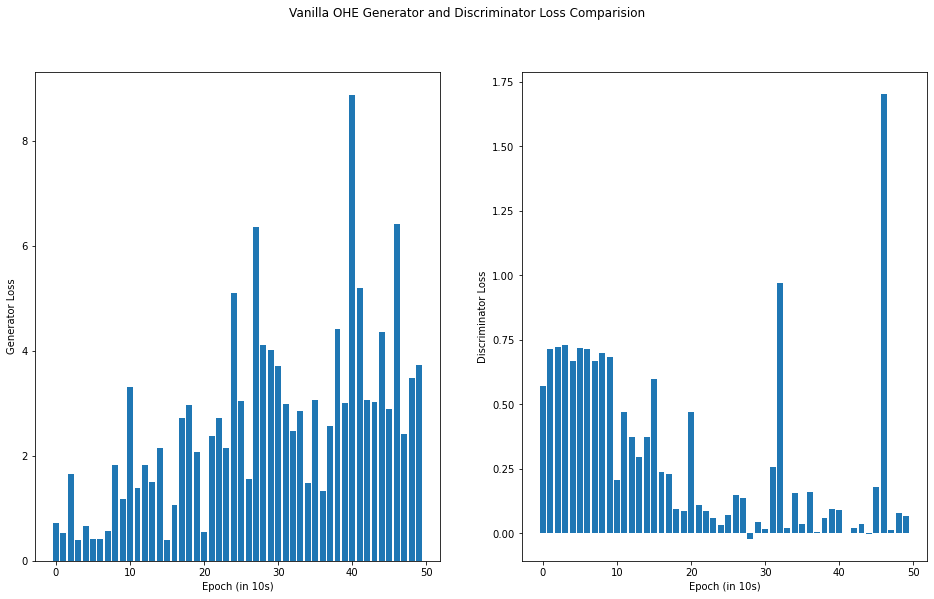

In [28]:
# plot out Vanilla OHE Loss
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 9))
fig.suptitle("Vanilla OHE Generator and Discriminator Loss Comparision")
ax[0].bar(vanilla_OHE_df.index, vanilla_OHE_df[" D(G(z_mis))"])
ax[0].set_ylabel("Generator Loss")
ax[0].set_xlabel("Epoch (in 10s)")

ax[1].bar(vanilla_OHE_df.index, vanilla_OHE_df[" D(z_c)"])
ax[1].set_ylabel("Discriminator Loss")
ax[1].set_xlabel("Epoch (in 10s)")


In the above for our vanilla one-hot encoding model, the loss for the Discriminator goes down as the number of epochs increase, while the loss for the generator increases.  It is important to note that there appear to be some outliers in the Discriminator analysis, but this does not influence the overall pattern of loss decreasing.  The Discriminator decreasing in loss initially suggests that the GAN is becoming better at detecting fakes images.  The loss increasing in the Generator initially suggests that the GAN is not able to generate images that closely resemble real images.  With both taken into context, there is evidence to suggest that the GAN is only getting better at detecting fake images generated by the Generator and that the Generator is struggling to "fool" the Discriminator.  This model took 189 minutes to train fully.

## Model Checkpointing
Let's load up a previous run and see how the images evolved over the run. The blocks below use the state_dict property to save and load data. The second block is nice for running this notebook only to show the results of a previous run. 

In [13]:
# save off everything at the end (same as the checkpoint)
save_checkpoint(img_list, loaded_ims, generator, discriminator, 'vanilla_OHE')

In [14]:
# load the models (nice for showing results from previous run)
ims, generator, discriminator = load_checkpoint('vanilla_OHE', Generator, Discriminator)

C:\Users\EV-04\AppData\Local\Temp/ipykernel_18744/1727329474.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.float)


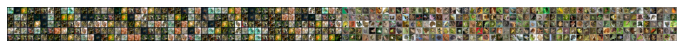

In [15]:
def norm_grid(im):
    # first half should be normalized and second half also, separately
    im = im.astype(np.float)
    rows,cols,chan = im.shape
    cols_over2 = int(cols/2)
    tmp = im[:,:cols_over2,:]
    im[:,:cols_over2,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    tmp = im[:,cols_over2:,:]
    im[:,cols_over2:,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    return im

      
fig = plt.figure(figsize=(12,4))
plt.axis("off")  
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

We are getting something that is similar to a frog, but also we are seeing a bit of mode collapse. The global properties of a greenish or gray blob surrounded by various background is starting to comes across. However, the finer structure is not doing too well. That is, the legs and details in the background are not present yet. 

To improve this result, there are a number of things we might try such as:
- Using the Radford guided methods (implemented already in 2022)
- Adding more randomization to the optimizer
- Running the discriminator multiple times for each generator update
- Changing the objective function (let's try this one)

____
# Least Squares GAN
Actually, the only thing we need to do here is replace the adversarial loss function. Note that we are NOT going to make additions to the architecture where the one hot encoding of the classes (and random classes) are used in both the generator and discriminator. This means that we might see a bit more mode collapse in our implementation. 

In [16]:
generator = Generator()
discriminator = Discriminator()


# LSGAN paper says they use ADAM, but follow up papers say RMSProp is slightly better
#lr = 0.0002
#betas = (0.5, 0.999)

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), 
                                    lr=0.0004, weight_decay=1e-8)

# used to be: adversarial_loss = torch.nn.BCELoss() # binary cross entropy 
adversarial_loss = torch.nn.MSELoss() # mean squared error loss 

generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (classification_layer): Sequential(
    (0): Linear(in_features=522, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

In [17]:
iterations = EPOCHS #defined above

# Sample random points in the latent space
# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))


In [18]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_LS = []
discriminator_loss_LS = []

# code is the exact same as above, no need to change it
# because we have changed the adversarial loss function
# Start training loop

# Becasue not much is changing, an interesting update would
# be to write a "train step" function and use it here.
# Something like: train_step(g, d, imgs, loss_select=MSE, num_d_steps=1)

run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('ls', 
                                                       Generator, 
                                                       Discriminator)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()

    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))

        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        # misleading target, c=1
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get MSE Loss function
        # want generator output to generate images that are "close" to all "ones" 
        
        # MODIFICATION: Added labels to the discriminator class
        g_loss = adversarial_loss(discriminator(generated_images, labels=torch_labels), misleading_targets)

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])
        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (becasue we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        # real label, a=1 and fake label, b=0
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))
        # Add random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of MSE(real images labeled as real) + MSE(fake images labeled as fake)
        # MODIFICATION: Added labels to the discriminator class
        d_loss = (
            adversarial_loss(discriminator(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            adversarial_loss(discriminator(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================
        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss_LS.append(g_loss.item())
    discriminator_loss_LS.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        
        # Print metrics
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        # save images in a list for display later
        with torch.no_grad():
            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'ls')

Loss at step 1: D(z_c)=0.2752116024494171, D(G(z_mis))=0.5920087695121765
Loss at step 11: D(z_c)=0.22337499260902405, D(G(z_mis))=0.16929788887500763
Loss at step 21: D(z_c)=0.16941073536872864, D(G(z_mis))=0.33647724986076355
Loss at step 31: D(z_c)=0.19633078575134277, D(G(z_mis))=0.3570493459701538
Loss at step 41: D(z_c)=0.22881034016609192, D(G(z_mis))=0.3994889557361603
Loss at step 51: D(z_c)=0.25390225648880005, D(G(z_mis))=0.2721615433692932
Loss at step 61: D(z_c)=0.1586580127477646, D(G(z_mis))=0.35933199524879456
Loss at step 71: D(z_c)=0.10150644183158875, D(G(z_mis))=0.5007202625274658
Loss at step 81: D(z_c)=0.09681807458400726, D(G(z_mis))=0.6677431464195251
Loss at step 91: D(z_c)=0.07314565777778625, D(G(z_mis))=0.9270142316818237
Loss at step 101: D(z_c)=0.12046240270137787, D(G(z_mis))=0.35210204124450684
Loss at step 111: D(z_c)=0.061623089015483856, D(G(z_mis))=0.5350087881088257
Loss at step 121: D(z_c)=0.048746973276138306, D(G(z_mis))=0.6211798191070557
Loss a

Text(0.5, 0, 'Epoch (in 10s)')

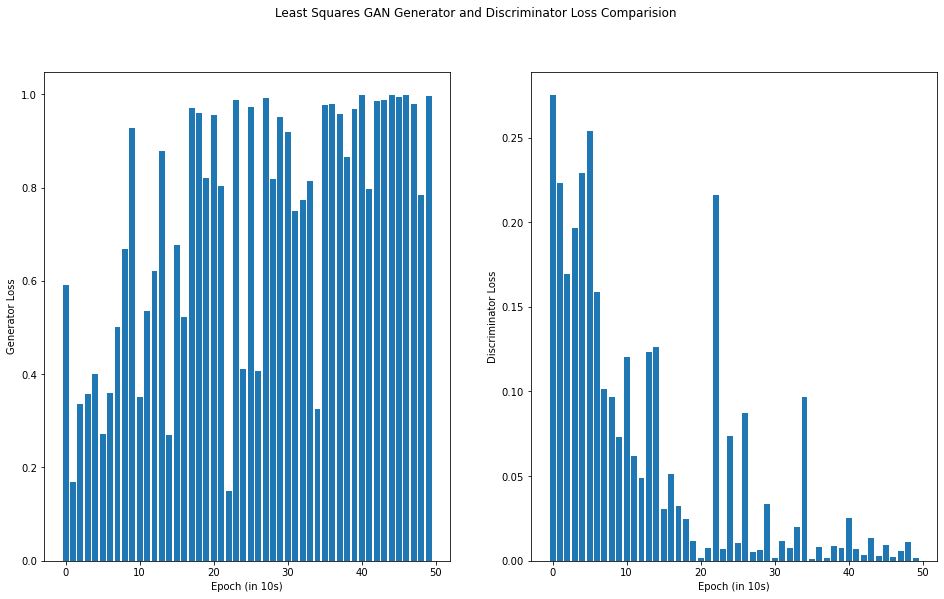

In [29]:
# plot out LS Loss
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 9))
fig.suptitle("Least Squares GAN Generator and Discriminator Loss Comparision")
ax[0].bar(vanilla_LS_df.index, vanilla_LS_df[" D(G(z_mis))"])
ax[0].set_ylabel("Generator Loss")
ax[0].set_xlabel("Epoch (in 10s)")

ax[1].bar(vanilla_LS_df.index, vanilla_LS_df[" D(z_c)"])
ax[1].set_ylabel("Discriminator Loss")
ax[1].set_xlabel("Epoch (in 10s)")

Similar to the Vanilla OHE GAN - Least Squares GAN shows us similar patterns.  These patterns suggest that the Discriminator is getting better at detecting fake and generated images from the Generator, as loss is decreasing over the number of epochs.  The Generator loss is not necessarily going up over the number of epochs, but it is at a relatively high loss compared to the Discriminator class.  Thus, this suggests that the Generator is not generating sufficient generated images to fool the Discriminator.  This model took 185 minutes - so far this is the fastest model, but only by 4 minutes.

In [19]:
save_checkpoint(img_list, loaded_ims, generator, discriminator, 'ls')

In [20]:
# Load up a run, if you want 
ims, generator, discriminator = load_checkpoint('ls', Generator, Discriminator)

C:\Users\EV-04\AppData\Local\Temp/ipykernel_18744/1727329474.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.float)


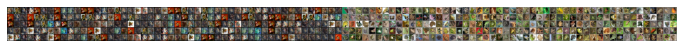

In [21]:
fig = plt.figure(figsize=(12,4))
plt.axis("off")  
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

Well, these results are not exactly a great imprvment. Mode collapse is more apparent here as well, but the fine structure of the frogs is also not quite the improvement that we wanted. Looking back through the iterations, there was some indication of more successful generations. Subjectively, the frogs started to show up, but then generation became slightly worse. We could run this code for many more iterations, and that might work in terms of getting the optimizers to create better distributions. But it is not guaranteed. 

Instead, now let's try using a Wasserstein GAN, where we use the gradient penalty as a method of making the discrminator 1-lipschitz (and therefore a valid critic to approximate the earth mover distance). 

___
# Wasserstein GAN with Gradient Penalty
For this implementation, we need to add functionality to the gradient of the Discriminator to make it a critic. For the most part, we need to add the gradient loss function calculations to match the WGAN-GP.

In [22]:
class WGCritic(nn.Module):

    def __init__(self):
        super(WGCritic, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        self.model = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 32), # group==1 is same as 2d layer norm

            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 64), # group==1 is same as 2d layer norm

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 128), # group==1 is same as 2d layer norm
        )

        # The height and width of downsampled image
        ds_size = width // 2 ** 4
        # Classification layer (just linear for the WGAN, critic)
        # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1))

    def forward(self, img, labels):
        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        validity = self.classification_layer(out)
        return validity

In [23]:
# Initialize generator and discriminator
generator = Generator() # same generator, with new discriminator
discriminator = WGCritic()

# params from WGAN-GP paper
# learning rate
lr = 0.0001
beta1 = 0
beta2 = 0.9
# number of training steps for discriminator per iter for WGANGP
n_critic = 5
# Loss weight for gradient penalty
lambda_gp = 10

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1

# Optimizers, no loss function defined here as
# will use torch.mean as loss function for WGAN.

 
# discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), lr=lr)
# gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=lr)

# Use ADAM 
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                              lr=lr, betas=(beta1, beta2))
gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                    lr=lr, betas=(beta1, beta2))


# History: This worked okay with RMSProp and Batch norm/dropout in the critic
#. Attempt 1 to improve: took out batch norm, dropout, and started using Adam (bad results)
#. Attempt 2 to improve: took out batch norm, dropout, and started using RMSProp (working from previous gen/critic, awful results)
#. Attempt 3: Mirrored more from the WGAN-GP paper (LayerNorm and Adam, w/ beta1=0)

This compute_gradient_penalty function for WGAN-GP comes from https://github.com/eriklindernoren/PyTorch-GAN/blob/master/implementations/wgan_gp/wgan_gp.py#L119.

In [24]:
def compute_gradient_penalty(D, real_samples, fake_samples, labels):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    epsilon = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    
    # Get random interpolation between real and fake samples
    interpolates = (epsilon * real_samples + ((1 - epsilon) * fake_samples)).requires_grad_(True)

    # MODIFICATION: Added labels here    
    d_interpolates = D(img=interpolates, labels=labels)
    fake = Variable(Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    
    # Get gradient w.r.t. interpolates
    # Computes and returns the sum of gradients of outputs with respect to the inputs.
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake, #  Jacobian vector product, if applicable. Documentation says pass in all ones (w/ no gradients) if not used
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0] # zero element is the sum for each of the interpolates
    
    # flatten gradients
    # same as this: gradients = gradients.view(gradients.size(0), -1)
    gradients = torch.flatten(gradients, start_dim=1) # don't flatten over batch size
    
    #. nowsize is batch x gradient size
    # use norm approx equal to one, as stated in paper. Rather than <1.
    # collapse norm across the batch, then take mean of each batch - 1
    # Using L2 norm of gradient
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

In [25]:
iterations = EPOCHS #defined above

# Sample random points in the latent space
# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))



In [26]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_WGAN = []
discriminator_loss_WGAN = []

#   we can continue a longer training run. 
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('wgan', 
                                                       Generator, 
                                                       WGCritic)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints
    # Use ADAM 
    discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                                  lr=lr, betas=(beta1, beta2))
    gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                        lr=lr, betas=(beta1, beta2))

for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()

    # MODIFICATION: add idx tracker
    idx = 0
    
    for i, (imgs, _) in enumerate(dataloader):
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        
        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
       
        # Decode them to fake images
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)
        
        # Compute gradient penalty
        # MODIFICATION: add labels to discriminator
        gradient_penalty = compute_gradient_penalty(discriminator, real_images.data, generated_images.data, labels=torch_labels)
        
        # MODIFICATION: Added labels to the discriminator class
        # minimize this, 
        d_loss = -torch.mean(discriminator(real_images, labels=torch_labels)) + \
                  torch.mean(discriminator(generated_images, labels=torch_labels)) + \
                  lambda_gp * gradient_penalty

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()
        
        #===================================
        
        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Train the generator for every n_critic iterations
        if i % n_critic == 0:
            # Decode them to fake images, through the generator
            # MODIFICATION: Added labels to the generator class
            generated_images = generator(random_latent_vectors, labels=torch_labels)

            # Adversarial loss from critic
            # MODIFICATION: Added labels to the discriminator class
            g_loss = -torch.mean(discriminator(generated_images, labels=torch_labels))

            # now back propagate to get derivatives
            g_loss.backward()

            # use gan optimizer to only update the parameters of the generator
            # this was setup above to only use the params of generator
            gan_optimizer.step()
        
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)

    # MODIFICATION: capture generator and discriminator loss
    generator_loss_WGAN.append(g_loss.item())
    discriminator_loss_WGAN.append(d_loss.item())
        
    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        
        # Print metrics
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        # save images in a list for display later
        with torch.no_grad():
            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'wgan')
        

Loss at step 1: D(z_c)=-0.45004159212112427, D(G(z_mis))=0.8581996560096741
Loss at step 11: D(z_c)=-0.792003333568573, D(G(z_mis))=4.735368728637695
Loss at step 21: D(z_c)=-0.7722979187965393, D(G(z_mis))=5.406623840332031
Loss at step 31: D(z_c)=-0.7842041850090027, D(G(z_mis))=6.754012107849121
Loss at step 41: D(z_c)=-0.8699871897697449, D(G(z_mis))=8.545392036437988
Loss at step 51: D(z_c)=-0.7486064434051514, D(G(z_mis))=9.308483123779297
Loss at step 61: D(z_c)=-0.6213128566741943, D(G(z_mis))=9.507502555847168
Loss at step 71: D(z_c)=-0.5579683184623718, D(G(z_mis))=10.055703163146973
Loss at step 81: D(z_c)=-0.5210930109024048, D(G(z_mis))=10.591730117797852
Loss at step 91: D(z_c)=-0.5492340326309204, D(G(z_mis))=11.810945510864258
Loss at step 101: D(z_c)=-0.5130136013031006, D(G(z_mis))=11.664060592651367
Loss at step 111: D(z_c)=-0.5931699872016907, D(G(z_mis))=12.513726234436035
Loss at step 121: D(z_c)=-0.5611956119537354, D(G(z_mis))=12.303683280944824
Loss at step 131

Text(0.5, 0, 'Epoch (in 10s)')

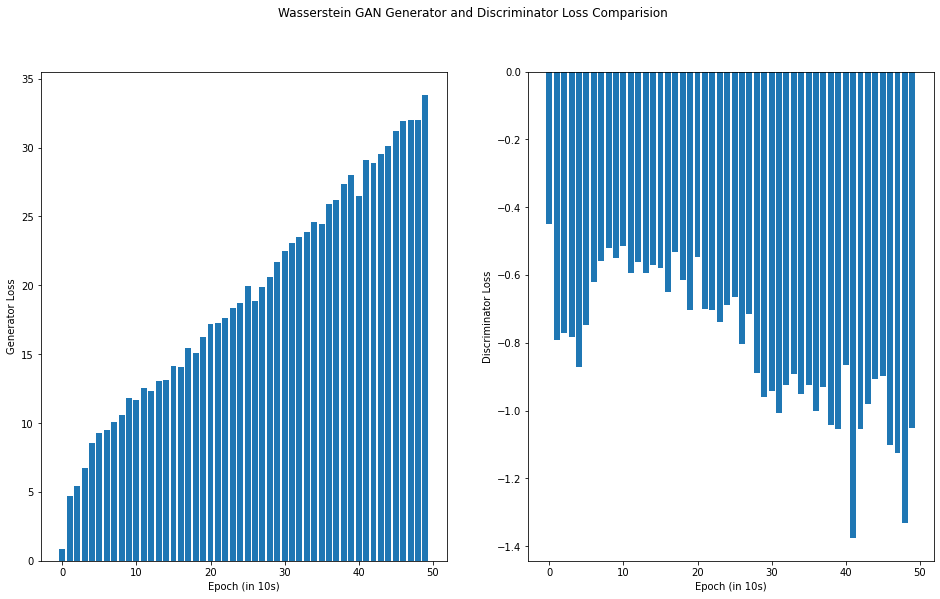

In [33]:
# plot out WGAN Loss
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 9))
fig.suptitle("Wasserstein GAN Generator and Discriminator Loss Comparision")
ax[0].bar(wgan_df.index, wgan_df[" D(G(z_mis))"])
ax[0].set_ylabel("Generator Loss")
ax[0].set_xlabel("Epoch (in 10s)")

ax[1].bar(wgan_df.index, wgan_df["D(z_c)"])
ax[1].set_ylabel("Discriminator Loss")
ax[1].set_xlabel("Epoch (in 10s)")

To round out the 3 vanilla variants, WGAN with Gradient Penalty follows similar patterns where the Generator loss increasing over the number of epochs while the Discriminator Loss decreases over the number of epochs.  It is important to note that the Discriminator loss can be negative, and often is because of how it is implemented.  Regardless of the sign of the loss, Discriminator loss decreases over the number of epochs suggesting that the Discriminator is becoming better at detecting generated images, while the Generator loss increased suggesting that the Generator struggled to generated images that closely match real images.  This model took 226 minutes

In [27]:
ims, generator, discriminator = load_checkpoint('wgan', Generator, WGCritic)

C:\Users\EV-04\AppData\Local\Temp/ipykernel_18744/1727329474.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.float)


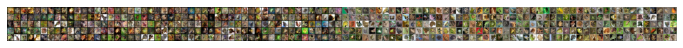

In [28]:
fig = plt.figure(figsize=(12,4))
plt.axis("off")  
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

The WGAN-GP seem to be a bit better (on some runs) for finding more divers backgrounds. You can also notice that one of the runs seems to start finding legs, which is something the other methods struggled with. 

# Feature Matching
>[4 points]  Implement one item from the list in the GAN training and generate samples of your dataset images. Explain the method you are using and what you hypothesize will occur with the results.  Train the GAN running for at least 500 epochs. Subjectively, did this improve the generated results? Did training time increase or decrease and by how much? Explain.

The first method we implement is feature matching.  Feature matching aims to improve Generator performance by encouraging the Generator to produce images based on a set of higher level features - as opposed to current state where the Generator creates images at the pixel level.  Feature matching is intended to take the above GANs where the Generator struggles to fool the Discriminator and assist in generating images based on high leveled features.  The idea is to take features from the Discriminator and use these features to train the Generator.  We can take these features from any part of the Discriminator, but we decide to keep this simple and take the last layer features (before the output).  Because the Discriminator will be providing us features, we need some feature loss function to use for training (not BCE like above methods).

We hypothesize that the losses for the Generator will start to decrease over time while the Discriminator losses will either remain neutral or decrease marginally.  Typically, if one loss decreases the other increases.  We believe this pattern will occur in this case.

Therefore, with the above explanation on our view of Feature Matching, we made the following changes:
- Created a new Discriminator class where we take out the classification layer because we need to output features for this
- Using a MSE loss function for feature matching
- Modified the forward function to output the last layer features
- When training, we create a set of misleading targets, but we move the remaining Generator code after the Discriminator in order to train the Discriminator and extract features.  We then take these extracted features to train the Generator.  Originally, we training the Generator then Discriminator.  This time it is flipped (like WGAN)

In [29]:
class Discriminator_FM(nn.Module):

    def __init__(self):
        super(Discriminator_FM, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        self.model = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.3, inplace=True),
            nn.BatchNorm2d(32),

            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(128),
        )

        # # The height and width of downsampled image
        # ds_size = width // 2 ** 4
        # # Classification layer
        # # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        # self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1), 
        #                                           nn.Sigmoid())

    # MODIFICATION: labels need to be encoded here
    def forward(self, img, labels):

        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        return out
        # validity = self.classification_layer(out)
        # return validity

In [30]:
generator = Generator()
discriminator_fm = Discriminator_FM()

In [31]:
# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# Could these be AdaM? Would that improve performance? :) 
# Decay rate here might be a tad aggressive...
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator_fm.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=0.0004, weight_decay=1e-8)

# THIS LINE OF CODE DEFINES THE FUNCTION WE WILL USE AS LOSS
adversarial_loss = torch.nn.BCELoss() # binary cross entropy 

# MODIFICATION: added a feature loss function for feature mapping
feature_loss_fn = torch.nn.MSELoss()


In [32]:
generator.apply(weights_init)
discriminator_fm.apply(weights_init)

Discriminator_FM(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)

In [33]:
iterations = EPOCHS

# Sample random points in the latent space

# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))

In [34]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_FM = []
discriminator_loss_FM = []

# optionally load the checkpoint data here from previous run
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator_fm = load_checkpoint('vanilla_FM', 
                                                       Generator, 
                                                       Discriminator_FM)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

# Start training loop
for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator_fm.train()
    
    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
        
        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get BCE Loss function
        # E[log d(x_fake)]
        # want generator output to generate images that are "close" to all "ones" 

        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])

        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (because we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))

        # Add small random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of BCE(real images labeled as real) + BCE(fake images labeled as fake)
        #  E[log d(x_real)] + E[log 1- d(x_fake)]

        # MODIFICATION: Added labels to the discriminator class
        # d_loss = (
        #     adversarial_loss(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
        #     adversarial_loss(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
        #     ) / 2
        d_loss = (
            feature_loss_fn(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            feature_loss_fn(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()

        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator_fm.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================

        # UPDATE GENERATOR

        # MODIFICATION: Added labels to the discriminator class, generator loss needs to be on what discriminator thinks is real vs fake features
        g_loss = feature_loss_fn(discriminator_fm(real_images, labels=torch_labels), discriminator_fm(generated_images, labels=torch_labels))

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()
        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss_FM.append(g_loss.item())
    discriminator_loss_FM.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator_fm.eval()
        # Print metrics (TODO: these are actually binary cross entropy, not Disc outputs..)
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        
        # save images in a list for display later
        with torch.no_grad():

            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator_fm, 'vanilla_FM')

c:\Users\EV-04\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([250, 1])) that is different to the input size (torch.Size([250, 522])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Loss at step 1: D(z_c)=1.3370853662490845, D(G(z_mis))=1.5187890529632568
Loss at step 11: D(z_c)=0.870219349861145, D(G(z_mis))=0.9061355590820312
Loss at step 21: D(z_c)=0.621311366558075, D(G(z_mis))=0.5793420672416687
Loss at step 31: D(z_c)=0.4552086889743805, D(G(z_mis))=0.38554510474205017
Loss at step 41: D(z_c)=0.3500032424926758, D(G(z_mis))=0.13090813159942627
Loss at step 51: D(z_c)=0.2878798246383667, D(G(z_mis))=0.03636910766363144
Loss at step 61: D(z_c)=0.2582946717739105, D(G(z_mis))=0.006721661891788244
Loss at step 71: D(z_c)=0.2505364418029785, D(G(z_mis))=0.0003989021643064916
Loss at step 81: D(z_c)=0.2509382367134094, D(G(z_mis))=1.9011413598946092e-07
Loss at step 91: D(z_c)=0.24921366572380066, D(G(z_mis))=1.1051842774278953e-09
Loss at step 101: D(z_c)=0.24963192641735077, D(G(z_mis))=1.4528537484181925e-08
Loss at step 111: D(z_c)=0.24979743361473083, D(G(z_mis))=4.184893498404563e-08
Loss at step 121: D(z_c)=0.24981991946697235, D(G(z_mis))=6.32010852541498e

Text(0.5, 0, 'Epoch (in 10s)')

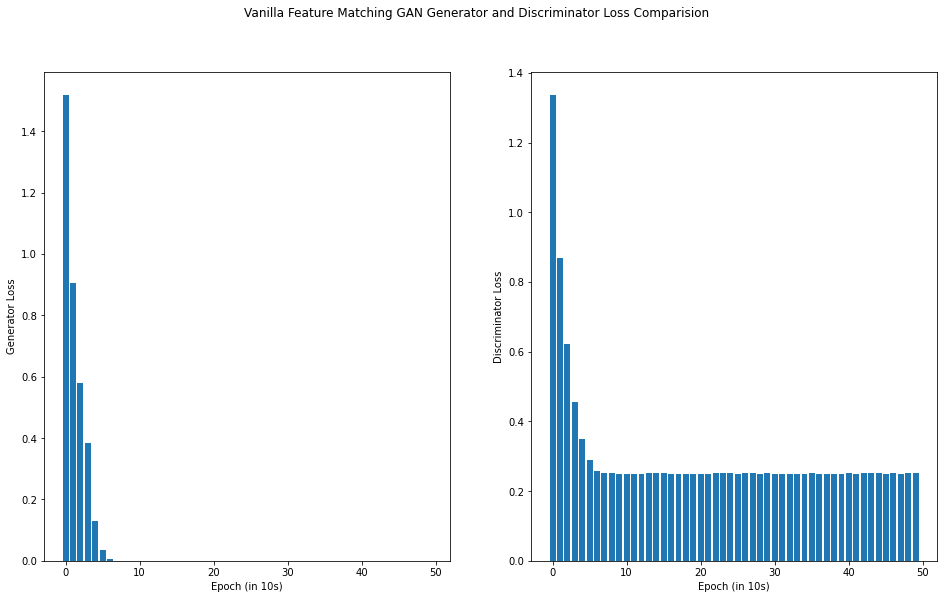

In [35]:
# plot out vanilla_FM_df Loss
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 9))
fig.suptitle("Vanilla Feature Matching GAN Generator and Discriminator Loss Comparision")
ax[0].bar(vanilla_FM_df.index, vanilla_FM_df[" D(G(z_mis))"])
ax[0].set_ylabel("Generator Loss")
ax[0].set_xlabel("Epoch (in 10s)")

ax[1].bar(vanilla_FM_df.index, vanilla_FM_df[" D(z_c)"])
ax[1].set_ylabel("Discriminator Loss")
ax[1].set_xlabel("Epoch (in 10s)")

It appears that our hypothesis regarding Generator loss turned out to be correct.  As for the Discriminator the loss decreases significantly for the first 100 epochs, but does tail off to consistent loss for the last 400 epochs.  There is evidence to support that the Generator has become very good at generating images that fool the Discriminator.  There is also evidence to suggest that this Discriminator is still very strong at detecting fake images, but it consistently gets fooled by certain generated images as indicated by a consistently non-changing loss.  We believe this was a successful implementation of Feature Matching given our research into how it is supposed to be used and implemented.  We do question why the Discriminator leveled off and had consistent loss.  One hypothesis is perhaps we should have kept the final output layer but created some separate function that extracts features instead.  But the research on implementing this suggests to not do this (we referenced this paper: https://paperswithcode.com/method/feature-matching).  As shown in his code, he comments out his Sigmoid layer but keeps his other layers active.  Whereas, for our method we also take out the sigmoid layer and associated Linear layer but extracted our features from the convolutions.  Dr. Larson, thoughts on this?

This model took 193 minutes

# Historical Averaging
>[4 points] Implement ANOTHER item in the list in the GAN training and generate samples of your dataset images.  Repeat the previous step. You can add this to your previous implementation or run this in isolation as you prefer. 

The second method we implemented is Historical Averaging.  Like Feature matching, Historical Averaging also aims to improve Generator performance by averaging the gradients of generated samples, thereby creating stability in the training.  We built Historical Averaging on top of Feature Matching and therefore we believe that Historical Averaging should improve upon the Generator only and not the Discriminator.  In order to implement Historical Averaging, we take the gradients of the generator each loop and create a continuous average of these gradients.  We then reapply these gradients back to the Generator after backpropogation in order to ensure that the next epoch uses these weight changes to generate sample images.

We hypothesize that the losses for the Generator will marginally increase over epochs because Feature Matching already vastly improved these.  Additionally, we hypothesize that the Discriminator loss will not change compared to Feature Matching.

With the above explanation on our view of Historical Averaging, we made the following changes:
- Extract Generator weights and average out based on the sum of the weights divided by the length of the weight vector

In [35]:
generator = Generator()
discriminator_fm = Discriminator_FM()

In [36]:
# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# Could these be AdaM? Would that improve performance? :) 
# Decay rate here might be a tad aggressive...
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator_fm.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=0.0004, weight_decay=1e-8)

# THIS LINE OF CODE DEFINES THE FUNCTION WE WILL USE AS LOSS
adversarial_loss = torch.nn.BCELoss() # binary cross entropy 

# MODIFICATION: added a feature loss function for feature mapping
feature_loss_fn = torch.nn.MSELoss()


In [37]:
generator.apply(weights_init)
discriminator_fm.apply(weights_init)

Discriminator_FM(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)

In [38]:
iterations = EPOCHS

# Sample random points in the latent space

# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))

In [39]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_FM_HA = []
discriminator_loss_FM_HA = []

# MODIFICATION: add list to capture Historical Weights
generator_historical_weights = []

# optionally load the checkpoint data here from previous run
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator_fm = load_checkpoint('vanilla_FM_HA', 
                                                       Generator, 
                                                       Discriminator_FM)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

# Start training loop
for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator_fm.train()
    
    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
        
        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get BCE Loss function
        # E[log d(x_fake)]
        # want generator output to generate images that are "close" to all "ones" 

        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])

        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (because we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))

        # Add small random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of BCE(real images labeled as real) + BCE(fake images labeled as fake)
        #  E[log d(x_real)] + E[log 1- d(x_fake)]

        # MODIFICATION: Added labels to the discriminator class
        # d_loss = (
        #     adversarial_loss(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
        #     adversarial_loss(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
        #     ) / 2
        d_loss = (
            feature_loss_fn(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            feature_loss_fn(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()

        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator_fm.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================

        # UPDATE GENERATOR

        # MODIFICATION: Added labels to the discriminator class, generator loss needs to be on what discriminator thinks is real vs fake features
        g_loss = feature_loss_fn(discriminator_fm(real_images, labels=torch_labels), discriminator_fm(generated_images, labels=torch_labels))

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()

        # MODIFICATION: Extract weights from generator
        generator_current_weights = [weights.data.clone() for weights in generator.parameters()]
        generator_historical_weights.append(generator_current_weights)

        # MODIFICATION: calculate average weights
        generator_average_weights = [sum(weight_v)/len(weight_v) for weight_v in zip(*generator_historical_weights, generator_current_weights)]

        # MODIFICATION: update weights in generator with avg
        for idx, weights in enumerate(generator.parameters()):
            weights.data = generator_average_weights[idx]

        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss_FM_HA.append(g_loss.item())
    discriminator_loss_FM_HA.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator_fm.eval()
        # Print metrics (TODO: these are actually binary cross entropy, not Disc outputs..)
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        
        # save images in a list for display later
        with torch.no_grad():

            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator_fm, 'vanilla_FM_HA')

Loss at step 1: D(z_c)=1.3401261568069458, D(G(z_mis))=1.6780389547348022
Loss at step 11: D(z_c)=0.8718440532684326, D(G(z_mis))=1.0238113403320312
Loss at step 21: D(z_c)=0.6205569505691528, D(G(z_mis))=0.6718459725379944
Loss at step 31: D(z_c)=0.45548170804977417, D(G(z_mis))=0.3694234788417816
Loss at step 41: D(z_c)=0.3494645953178406, D(G(z_mis))=0.19598840177059174
Loss at step 51: D(z_c)=0.2883407771587372, D(G(z_mis))=0.06714979559183121
Loss at step 61: D(z_c)=0.25909876823425293, D(G(z_mis))=0.013621633872389793
Loss at step 71: D(z_c)=0.25148117542266846, D(G(z_mis))=0.0006222284864634275
Loss at step 81: D(z_c)=0.24993425607681274, D(G(z_mis))=1.2900152057682135e-07
Loss at step 91: D(z_c)=0.249837726354599, D(G(z_mis))=3.188165287326683e-09
Loss at step 101: D(z_c)=0.24965226650238037, D(G(z_mis))=4.1914816506505304e-08
Loss at step 111: D(z_c)=0.2501136064529419, D(G(z_mis))=2.428743073323858e-07
Loss at step 121: D(z_c)=0.250660240650177, D(G(z_mis))=2.2235461472064344

Text(0.5, 0, 'Epoch (in 10s)')

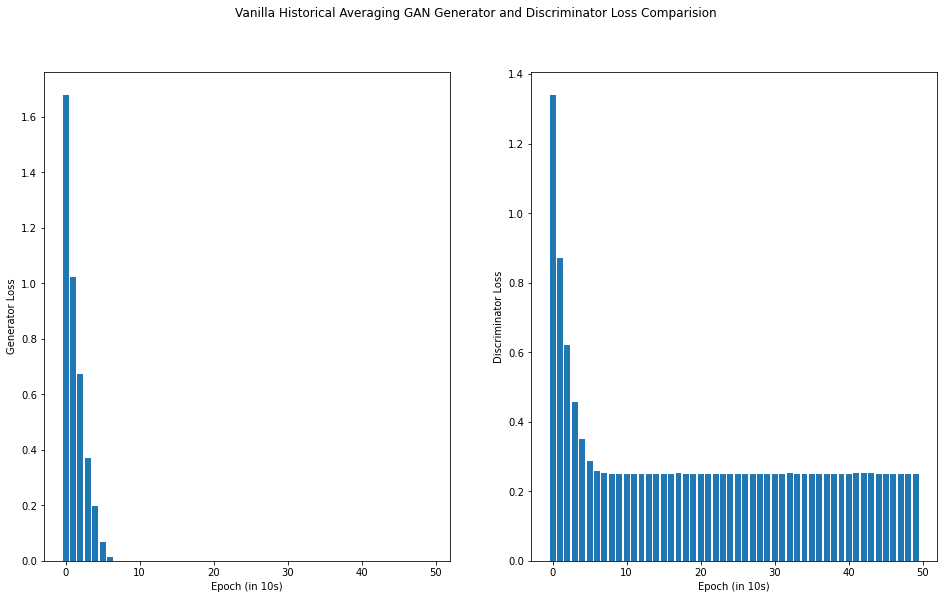

In [36]:
# plot out vanilla_FM_HA_df Loss
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 9))
fig.suptitle("Vanilla Historical Averaging GAN Generator and Discriminator Loss Comparision")
ax[0].bar(vanilla_FM_HA_df.index, vanilla_FM_HA_df[" D(G(z_mis))"])
ax[0].set_ylabel("Generator Loss")
ax[0].set_xlabel("Epoch (in 10s)")

ax[1].bar(vanilla_FM_HA_df.index, vanilla_FM_HA_df[" D(z_c)"])
ax[1].set_ylabel("Discriminator Loss")
ax[1].set_xlabel("Epoch (in 10s)")

There was marginal, if any improvement for the Generator loss.  This aligns with our hypothesis in where the historical averages would see little impact.  The Discriminator losses were similar as we made no modifications to the Discriminator class.

One change we would make if we were to do this again is to do Historical Averaging in isolation.  Although the Generator loss decreased and the Discriminator loss is also solid, there is no evidence to suggest Historical Averaging improved any performance and that Feature Matching is the core contributor to improved performance for these GANs.

This model took 960 minutes.  Yikes.

# Spectral Normalization for Wasserstein

>[4 points] Implement ANOTHER item in the list in the GAN training and generate samples of your dataset images. Repeat the previous step. You can add this to your previous implementation or run this in isolation as you prefer. 

Our final method of implementation is Spectral Normalization.  From how we understand Spectral Normalization, the idea is to normalize the weight matrices across the spectral norm.  We were confident that this needed to occur within the convolutional network, but if we had a larger sequential non-conv network, we could probably apply this method there as well.  Through our research, we determined this was supposed to help the overall convergence of the training.

Our hypothesis, even though this only appears to affect the Critic (Discriminator) is that the losses will start to level out for both classes.  We believe this because essentially we are normalizing weights, so therefore we would expect losses to not look so exponential as in the above WGAN, but more flat.

Changes we made:
- Created a new WGCritic in where we applied the spectral_norm function to each convolution.  We got this guidance direct from torch documentation on both application and to which layer.

In [40]:
class WGCritic_SN(nn.Module):

    def __init__(self):
        super(WGCritic_SN, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        # MODIFICATION: Added Spectral Norm Function
        self.model = nn.Sequential(
            spectral_norm(nn.Conv2d(3, 16, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),

            spectral_norm(nn.Conv2d(16, 32, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 32), # group==1 is same as 2d layer norm

            spectral_norm(nn.Conv2d(32, 64, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 64), # group==1 is same as 2d layer norm

            spectral_norm(nn.Conv2d(64, 128, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 128), # group==1 is same as 2d layer norm
        )

        # The height and width of downsampled image
        ds_size = width // 2 ** 4
        # Classification layer (just linear for the WGAN, critic)
        # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1))

    def forward(self, img, labels):
        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        validity = self.classification_layer(out)
        return validity

In [41]:
# Initialize generator and discriminator
generator = Generator() # same generator, with new discriminator
discriminator = WGCritic_SN()

# params from WGAN-GP paper
# learning rate
lr = 0.0001
beta1 = 0
beta2 = 0.9
# number of training steps for discriminator per iter for WGANGP
n_critic = 5
# Loss weight for gradient penalty
lambda_gp = 10

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1

# Optimizers, no loss function defined here as
# will use torch.mean as loss function for WGAN.

 
# discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), lr=lr)
# gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=lr)

# Use ADAM 
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                              lr=lr, betas=(beta1, beta2))
gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                    lr=lr, betas=(beta1, beta2))


# History: This worked okay with RMSProp and Batch norm/dropout in the critic
#. Attempt 1 to improve: took out batch norm, dropout, and started using Adam (bad results)
#. Attempt 2 to improve: took out batch norm, dropout, and started using RMSProp (working from previous gen/critic, awful results)
#. Attempt 3: Mirrored more from the WGAN-GP paper (LayerNorm and Adam, w/ beta1=0)

In [42]:
iterations = EPOCHS #defined above

# Sample random points in the latent space
# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))



In [43]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_SN = []
discriminator_loss_SN = []

#   we can continue a longer training run. 
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('SN', 
                                                       Generator, 
                                                       WGCritic_SN)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints
    # Use ADAM 
    discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                                  lr=lr, betas=(beta1, beta2))
    gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                        lr=lr, betas=(beta1, beta2))

for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()

    # MODIFICATION: add idx tracker
    idx = 0
    
    for i, (imgs, _) in enumerate(dataloader):
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        
        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
       
        # Decode them to fake images
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)
        
        # Compute gradient penalty
        # MODIFICATION: add labels to discriminator
        gradient_penalty = compute_gradient_penalty(discriminator, real_images.data, generated_images.data, labels=torch_labels)
        
        # MODIFICATION: Added labels to the discriminator class
        # minimize this, 
        d_loss = -torch.mean(discriminator(real_images, labels=torch_labels)) + \
                  torch.mean(discriminator(generated_images, labels=torch_labels)) + \
                  lambda_gp * gradient_penalty

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()
        
        #===================================
        
        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Train the generator for every n_critic iterations
        if i % n_critic == 0:
            # Decode them to fake images, through the generator
            # MODIFICATION: Added labels to the generator class
            generated_images = generator(random_latent_vectors, labels=torch_labels)

            # Adversarial loss from critic
            # MODIFICATION: Added labels to the discriminator class
            g_loss = -torch.mean(discriminator(generated_images, labels=torch_labels))

            # now back propagate to get derivatives
            g_loss.backward()

            # use gan optimizer to only update the parameters of the generator
            # this was setup above to only use the params of generator
            gan_optimizer.step()
        
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)

    # MODIFICATION: capture generator and discriminator loss
    generator_loss_SN.append(g_loss.item())
    discriminator_loss_SN.append(d_loss.item())
        
    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        
        # Print metrics
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        # save images in a list for display later
        with torch.no_grad():
            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'SN')
        

Loss at step 1: D(z_c)=0.3770923316478729, D(G(z_mis))=-0.8693311810493469
Loss at step 11: D(z_c)=-0.45899394154548645, D(G(z_mis))=2.8396155834198
Loss at step 21: D(z_c)=-0.49643513560295105, D(G(z_mis))=3.5945992469787598
Loss at step 31: D(z_c)=-0.727467954158783, D(G(z_mis))=4.081272602081299
Loss at step 41: D(z_c)=-0.7857804298400879, D(G(z_mis))=5.22948694229126
Loss at step 51: D(z_c)=-0.7106881737709045, D(G(z_mis))=6.394070625305176
Loss at step 61: D(z_c)=-0.7783758044242859, D(G(z_mis))=8.066184043884277
Loss at step 71: D(z_c)=-0.5013411045074463, D(G(z_mis))=8.009846687316895
Loss at step 81: D(z_c)=-0.3996587097644806, D(G(z_mis))=8.823906898498535
Loss at step 91: D(z_c)=-0.3227083683013916, D(G(z_mis))=8.015998840332031
Loss at step 101: D(z_c)=-0.34196820855140686, D(G(z_mis))=9.837820053100586
Loss at step 111: D(z_c)=-0.440642774105072, D(G(z_mis))=10.880999565124512
Loss at step 121: D(z_c)=-0.4319331645965576, D(G(z_mis))=10.464025497436523
Loss at step 131: D(z

Text(0.5, 0, 'Epoch (in 10s)')

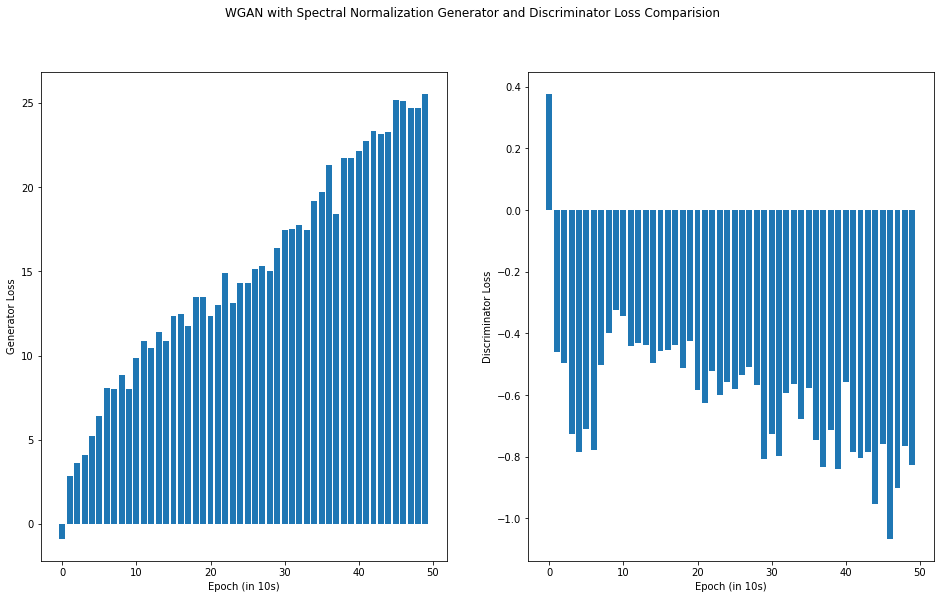

In [37]:
# plot out wgan_SN Loss
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 9))
fig.suptitle("WGAN with Spectral Normalization Generator and Discriminator Loss Comparision")
ax[0].bar(wgan_SN_df.index, wgan_SN_df[" D(G(z_mis))"])
ax[0].set_ylabel("Generator Loss")
ax[0].set_xlabel("Epoch (in 10s)")

ax[1].bar(wgan_SN_df.index, wgan_SN_df[" D(z_c)"])
ax[1].set_ylabel("Discriminator Loss")
ax[1].set_xlabel("Epoch (in 10s)")

The overall magnitudes of both losses decreased - whereby we don't see nearly as large losses in both the Generator and Discriminator compared to the original WGAN.  However, we can not say our hypothesis was supported as both patterns appear to still have an exponential shape.  One could argue that our implementation of Spectral Normalization hardly improved upon the original WGAN we had above.  The conclusion for this WGAN follows the original - Generator loss increases suggesting that the Generator is unable to generate sample images similar to real images and the Discriminator is able to correctly identify real and generated images.

This model took 249 minutes

# Final Analysis

Below we show all charts side by side as well as the times for each and give final thoughts on each GAN.

Text(0.5, 0, 'Epoch (in 10s)')

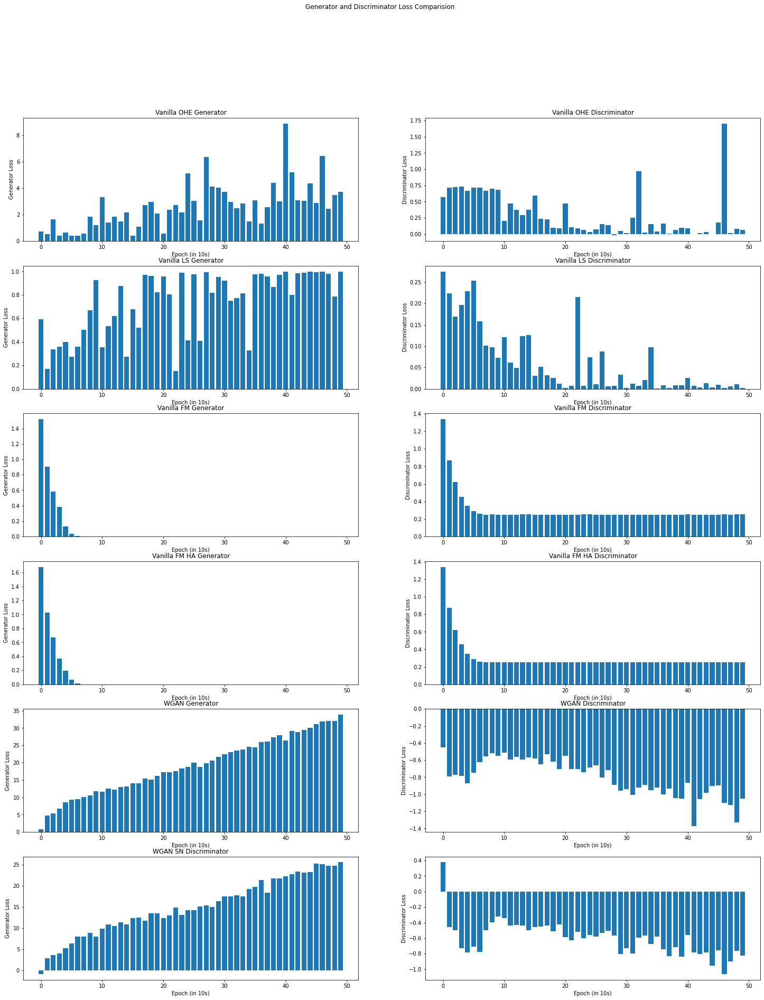

In [50]:
# plot out all loss
fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(25, 30))

fig.suptitle("Generator and Discriminator Loss Comparision")

ax[0,0].set_title("Vanilla OHE Generator")
ax[0,0].bar(vanilla_OHE_df.index, vanilla_OHE_df[" D(G(z_mis))"])
ax[0,0].set_ylabel("Generator Loss")
ax[0,0].set_xlabel("Epoch (in 10s)")
ax[0,1].set_title("Vanilla OHE Discriminator")
ax[0,1].bar(vanilla_OHE_df.index, vanilla_OHE_df[" D(z_c)"])
ax[0,1].set_ylabel("Discriminator Loss")
ax[0,1].set_xlabel("Epoch (in 10s)")

ax[1,0].set_title("Vanilla LS Generator")
ax[1,0].bar(vanilla_LS_df.index, vanilla_LS_df[" D(G(z_mis))"])
ax[1,0].set_ylabel("Generator Loss")
ax[1,0].set_xlabel("Epoch (in 10s)")
ax[1,1].set_title("Vanilla LS Discriminator")
ax[1,1].bar(vanilla_LS_df.index, vanilla_LS_df[" D(z_c)"])
ax[1,1].set_ylabel("Discriminator Loss")
ax[1,1].set_xlabel("Epoch (in 10s)")

ax[2,0].set_title("Vanilla FM Generator")
ax[2,0].bar(vanilla_FM_df.index, vanilla_FM_df[" D(G(z_mis))"])
ax[2,0].set_ylabel("Generator Loss")
ax[2,0].set_xlabel("Epoch (in 10s)")
ax[2,1].set_title("Vanilla FM Discriminator")
ax[2,1].bar(vanilla_FM_df.index, vanilla_FM_df[" D(z_c)"])
ax[2,1].set_ylabel("Discriminator Loss")
ax[2,1].set_xlabel("Epoch (in 10s)")

ax[3,0].set_title("Vanilla FM HA Generator")
ax[3,0].bar(vanilla_FM_HA_df.index, vanilla_FM_HA_df[" D(G(z_mis))"])
ax[3,0].set_ylabel("Generator Loss")
ax[3,0].set_xlabel("Epoch (in 10s)")
ax[3,1].set_title("Vanilla FM HA Discriminator")
ax[3,1].bar(vanilla_FM_HA_df.index, vanilla_FM_HA_df[" D(z_c)"])
ax[3,1].set_ylabel("Discriminator Loss")
ax[3,1].set_xlabel("Epoch (in 10s)")

ax[4,0].set_title("WGAN Generator")
ax[4,0].bar(wgan_df.index, wgan_df[" D(G(z_mis))"])
ax[4,0].set_ylabel("Generator Loss")
ax[4,0].set_xlabel("Epoch (in 10s)")
ax[4,1].set_title("WGAN Discriminator")
ax[4,1].bar(wgan_df.index, wgan_df["D(z_c)"])
ax[4,1].set_ylabel("Discriminator Loss")
ax[4,1].set_xlabel("Epoch (in 10s)")

ax[5,0].set_title("WGAN SN Generator")
ax[5,0].bar(wgan_SN_df.index, wgan_SN_df[" D(G(z_mis))"])
ax[5,0].set_ylabel("Generator Loss")
ax[5,0].set_xlabel("Epoch (in 10s)")
ax[5,0].set_title("WGAN SN Discriminator")
ax[5,1].bar(wgan_SN_df.index, wgan_SN_df[" D(z_c)"])
ax[5,1].set_ylabel("Discriminator Loss")
ax[5,1].set_xlabel("Epoch (in 10s)")

Text(0.5, 1.0, 'Time Comparisons between GANs')

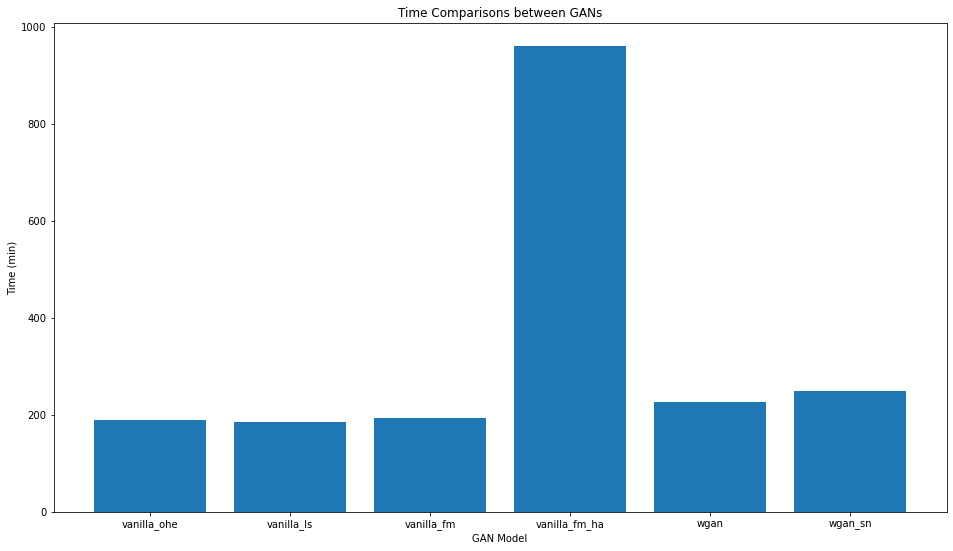

In [53]:
labels = ["vanilla_ohe", "vanilla_ls", "vanilla_fm", "vanilla_fm_ha", "wgan", "wgan_sn"]
time_m = [189, 185, 193, 960, 226, 249]

plt.figure(figsize=(16, 9))
plt.bar(x=labels, height=time_m)
plt.ylabel("Time (min)")
plt.xlabel("GAN Model")
plt.title("Time Comparisons between GANs")

Overall, the best performing GAN based on both Discrimintor and Generator loss is the Vanilla OHE with Feature Matching.  The Vanilla Historical Averaging took the longest, but this is somewhat expected due to the way we did averages (which was every epoch).  This could be improved upon timewise by using other averaging methods or a better algorithm.  Note: we did run this twice to make sure it was actually taking 15 hours and it did both times.  Taking out this outlier, the Vanilla LS GAN was the quickest at 185 minutes, but the best performing model only took about 8 minutes longer at 193 minutes total.

Compared to our baseline model, the feature matching GAN significantly outperformed this model by our metric of loss and was comparable in terms of time.  We are confident to say that feature matching implementation helped improve our GAN model signficantly.